# Analisi Esplorativa dei Dati (EDA) - HERO v4

Questo notebook esegue un'analisi esplorativa del dataset riconciliato `ipc_wfp_reconciled.csv`, che unisce:
1. **IPC**: Dati storici sulla sicurezza alimentare e classificazione delle fasi di crisi per area geografica.
2. **WFP Food Prices**: Prezzi alimentari e inflazione media calcolati storicamente sui mercati di riferimento.
3. **CHIRPS Rainfall**: Misure di piovosità mensile ed anomalie associate (r1h, rfq).

Utilizziamo le funzioni di plotting definite nel modulo centralizzato `hero_v4.libs.data_plots.plotter` per analizzare la qualità della mappatura spaziale (match gerarchico), le correlazioni generali ed i trend storici di paesi chiave.

In [1]:
import sys
import os
from pathlib import Path
import pandas as pd

# Aggiungiamo la root del progetto al path per poter importare il modulo plotter
notebook_path = Path(os.getcwd())
# Se siamo dentro hero_v4/plots/, la root del workspace e' due livelli sopra
workspace_dir = notebook_path.parent.parent
if str(workspace_dir) not in sys.path:
    sys.path.insert(0, str(workspace_dir))
    print(f"Aggiunto al path di sistema: {workspace_dir}")

from hero_v4.libs.data_plots.plotter import (
    load_reconciled_data,
    plot_wfp_match_distribution,
    plot_rain_match_distribution,
    plot_correlation_matrix,
    plot_inflation_vs_ipc,
    plot_rain_vs_ipc,
    plot_temporal_trends,
    plot_country_spatial_assignment
)

Aggiunto al path di sistema: c:\Dev\HERO


## 1. Caricamento del Dataset Riconciliato

Carichiamo i dati allineati e visualizziamo le colonne disponibili e il tasso di copertura.

In [2]:
# Definiamo il percorso esplicito al file CSV se non siamo nella directory corretta
csv_path = workspace_dir / "hero_v4" / "data" / "reconciled" / "ipc_wfp_reconciled.csv"
df = load_reconciled_data(csv_path)

print(f"Dimensioni del dataset riconciliato: {df.shape[0]:,} righe per {df.shape[1]} colonne\n")
print("Tasso di copertura delle co-variabili rispetto alle righe totali IPC:")
wfp_cov = (df["wfp_match_level"] != "No_Match").mean() * 100
rain_cov = (df["rain_match_level"] != "No_Match").mean() * 100
both_cov = ((df["wfp_match_level"] != "No_Match") & (df["rain_match_level"] != "No_Match")).mean() * 100
print(f" - Copertura prezzi WFP: {wfp_cov:.1f}%")
print(f" - Copertura piovosita CHIRPS: {rain_cov:.1f}%")
print(f" - Copertura di ENTRAMBI i dati contemporaneamente: {both_cov:.1f}%")

Dimensioni del dataset riconciliato: 72,213 righe per 35 colonne

Tasso di copertura delle co-variabili rispetto alle righe totali IPC:
 - Copertura prezzi WFP: 83.2%
 - Copertura piovosita CHIRPS: 27.9%
 - Copertura di ENTRAMBI i dati contemporaneamente: 27.9%


## 2. Analisi della Distribuzione del Match Spaziale (Fallback)

I grafici seguenti (sviluppati in Altair) mostrano come la pipeline abbia risolto geograficamente l'associazione dei mercati WFP e dei pixel di pioggia alle aree IPC. 
- **Admin2**: Match ottimale a livello di distretto.
- **Admin1_Code / Admin1_Name**: Match a livello provinciale (tramite codice o euristica testuale).
- **National**: Fallback a livello di media nazionale.
- **No_Match**: Area non associata (mancanza di confini geometrici o coordinate).

In [3]:
# Distribuzione dei match spaziali per i prezzi WFP
plot_wfp_match_distribution(df)

alt.Chart(...)

In [4]:
# Distribuzione dei match spaziali per le piogge CHIRPS
plot_rain_match_distribution(df)

alt.Chart(...)

## 3. Matrice di Correlazione

Visualizziamo l'intensità delle relazioni lineari tra le percentuali della popolazione nelle diverse fasi di severità dell'insicurezza alimentare (IPC Phase 1-5, e Phase 3+ cumulato) e le nostre co-variabili di mercato e climatiche.

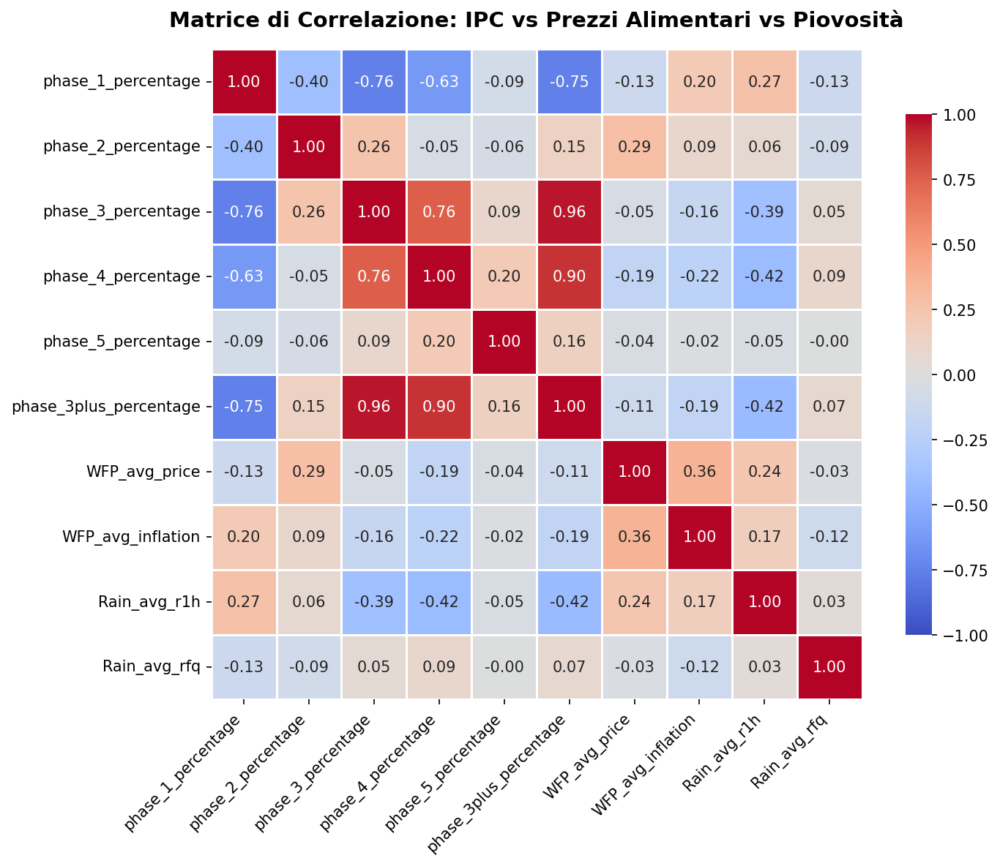

In [5]:
# Matrice di correlazione Seaborn
plot_correlation_matrix(df)

## 4. Analisi di Regressione e Dispersione (Plotly Interattivo)

Esploriamo la relazione tra le variabili attraverso grafici a dispersione interattivi con linea di regressione OLS (Ordinary Least Squares).

In [6]:
# Relazione globale: Inflazione Alimentare vs Severita Crisi IPC (Fase 3+)
fig_infl = plot_inflation_vs_ipc(df)
if fig_infl:
    fig_infl.show()

In [7]:
# Relazione globale: Anomalia Pioggia (rfq) vs Severita Crisi IPC (Fase 3+)
fig_rain = plot_rain_vs_ipc(df)
if fig_rain:
    fig_rain.show()

## 5. Focus Territoriali ed Evoluzione Temporale

Andiamo a vedere come queste variabili co-evolvono nel tempo in due dei teatri più critici per l'analisi umanitaria: lo **Yemen (YEM)** e l'**Afghanistan (AFG)**.

In [8]:
# Yemen - Scatter Inflazione vs IPC e trend temporali
fig_yem_scatter = plot_inflation_vs_ipc(df, country="YEM")
if fig_yem_scatter:
    fig_yem_scatter.show()

fig_yem_trends = plot_temporal_trends(df, "YEM")
if fig_yem_trends:
    fig_yem_trends.show()

In [9]:
# Afghanistan - Scatter Inflazione vs IPC e trend temporali
fig_afg_scatter = plot_inflation_vs_ipc(df, country="AFG")
if fig_afg_scatter:
    fig_afg_scatter.show()

fig_afg_trends = plot_temporal_trends(df, "AFG")
if fig_afg_trends:
    fig_afg_trends.show()

## 6. Mappe di Diagnostica Spaziale (Mercati e Regioni)

Per capire come sono stati associati i mercati WFP alle regioni amministrative (Admin2 districts), e diagnosticare eventuali anomalie o mercati esclusi, visualizziamo la sovrapposizione spaziale dei punti dei mercati sui poligoni dei distretti.

In particolare, mostriamo come l'introduzione di un **buffer di elasticità spaziale (max 0.05 gradi, ~5.5 km)** sia stata fondamentale per recuperare mercati costieri o fluviali (es. in Yemen e Mauritania) che altrimenti sarebbero risultati non mappati (`unmapped`) a causa di piccole discrepanze cartografiche o coordinate localizzate in mare aperto in corrispondenza di porti.

C:\Users\feder\anaconda3\envs\env_master_2026\Lib\site-packages\pyogrio\core.py:34: RuntimeWarning: Could not detect GDAL data files. Set GDAL_DATA environment variable to the correct path.
  _init_gdal_data()


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_yem.png
Visualizzazione mappa per lo Yemen: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_yem.png


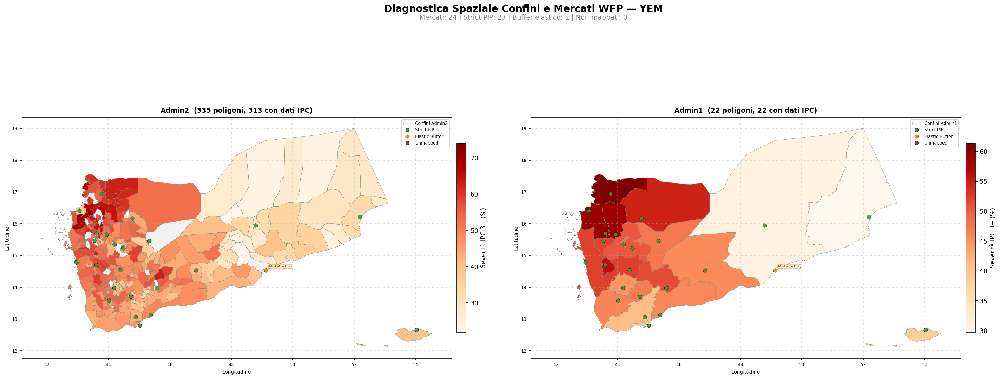

In [10]:
from IPython.display import Image, display

# Genera e visualizza la mappa diagnostica spaziale per lo Yemen (YEM)
yem_map_path = plot_country_spatial_assignment("YEM")
if yem_map_path:
    print(f"Visualizzazione mappa per lo Yemen: {yem_map_path}")
    display(Image(filename=str(yem_map_path)))

Nella mappa dello Yemen qui sopra, il mercato costiero di **Mukalla City** (indicato in arancione come **Rescued**) cadeva originariamente in mare aperto (nel Golfo di Aden), appena al di fuori dei confini del distretto terrestre. Grazie al buffer spaziale, è stato correttamente assegnato al rispettivo distretto costiero.

Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mrt.png
Visualizzazione mappa per la Mauritania: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mrt.png


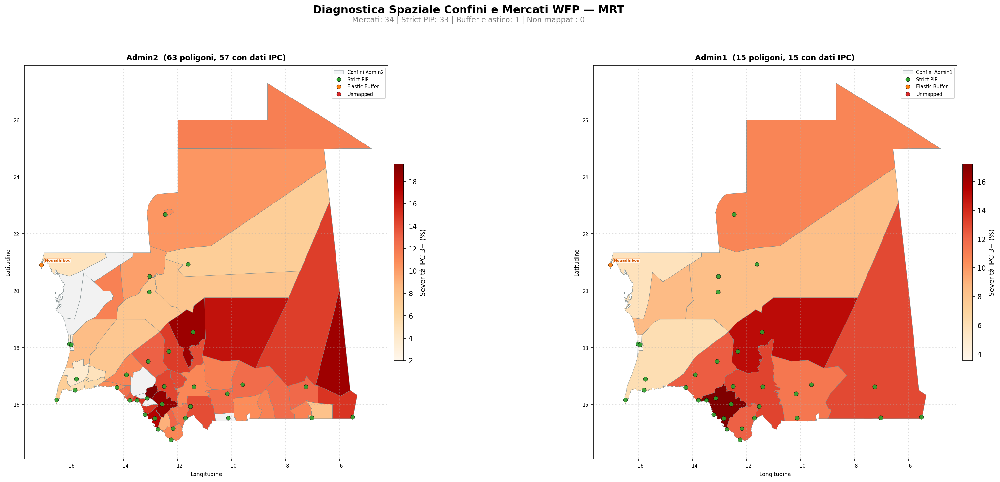

In [11]:
# Genera e visualizza la mappa diagnostica spaziale per la Mauritania (MRT)
mrt_map_path = plot_country_spatial_assignment("MRT")
if mrt_map_path:
    print(f"Visualizzazione mappa per la Mauritania: {mrt_map_path}")
    display(Image(filename=str(mrt_map_path)))

Nella mappa della Mauritania, il mercato di **Nouadhibou** si trova sulla penisola costiera al confine occidentale. Per via delle coordinate collocate leggermente in acqua all'interno della baia o della penisola stretta, ricadeva al di fuori dei confini dei poligoni terrestri ufficiali. L'algoritmo elastico lo ha identificato e assegnato correttamente, evitando di lasciarlo escluso.

### 6.1 Diagnostica Spaziale Globale (Tutti i Paesi)

Di seguito, eseguiamo la diagnostica spaziale per **tutti** i paesi inclusi nel dataset. I grafici generati mostrano la sovrapposizione tra i mercati WFP e i confini Admin2 di ciascun paese, aiutando a validare l'allineamento spaziale a livello distrettuale.

Generiamo inoltre una tabella riassuntiva che mostra il numero totale di mercati per paese e la ripartizione dei metodi di mapping spaziale utilizzati (PIP stretto, buffer elastico e non mappati).

In [12]:
# 1. Caricamento dati e recupero della lista completa di paesi
df = load_reconciled_data()
countries = sorted(df['Country'].dropna().unique())
print(f"Esecuzione della diagnostica spaziale per tutti i {len(countries)} paesi in corso...")

# 2. Esecuzione del plotter per ciascun paese
for country in countries:
    try:
        map_path = plot_country_spatial_assignment(country)
        if map_path and map_path.exists():
            print(f"[SUCCESS] Mappa diagnostica salvata per {country} -> {map_path.relative_to(workspace_dir)}")
        else:
            print(f"[INFO] Nessuna mappa generata per {country} (mancano dati cartografici o coordinate)")
    except Exception as e:
        print(f"[ERROR] Errore per il paese {country}: {e}")

print("\n--- Generazione Mappe Completata ---")

# 3. Generazione Tabella Riassuntiva del Mapping Spaziale per tutti i paesi
wfp_parquet_path = workspace_dir / "hero_v4" / "data" / "interim" / "wfp_with_pcodes.parquet"
if wfp_parquet_path.exists():
    df_wfp = pd.read_parquet(wfp_parquet_path)
    df_mkt = df_wfp[['ISO3', 'mkt_name', 'mapping_method_adm2']].drop_duplicates().copy()
    
    summary_df = df_mkt.groupby(['ISO3', 'mapping_method_adm2']).size().unstack(fill_value=0)
    
    for col in ['strict_pip', 'elastic_buffer', 'unmapped']:
        if col not in summary_df.columns:
            summary_df[col] = 0
            
    summary_df['Total_Markets'] = summary_df['strict_pip'] + summary_df['elastic_buffer'] + summary_df['unmapped']
    summary_df = summary_df[['Total_Markets', 'strict_pip', 'elastic_buffer', 'unmapped']]
    summary_df = summary_df.sort_values(by='Total_Markets', ascending=False)
    
    print("\n=== TABELLA DI SINTESI DEI METODI DI MAPPING (ADMIN 2) ===")
    display(summary_df)
else:
    print("File interim dei mercati non trovato per generare la tabella di sintesi.")

Esecuzione della diagnostica spaziale per tutti i 52 paesi in corso...


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_afg.png
[SUCCESS] Mappa diagnostica salvata per AFG -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_afg.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ago.png
[SUCCESS] Mappa diagnostica salvata per AGO -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ago.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bdi.png
[SUCCESS] Mappa diagnostica salvata per BDI -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bdi.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ben.png
[SUCCESS] Mappa diagnostica salvata per BEN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ben.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bfa.png
[SUCCESS] Mappa diagnostica salvata per BFA -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bfa.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bgd.png
[SUCCESS] Mappa diagnostica salvata per BGD -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_bgd.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_caf.png
[SUCCESS] Mappa diagnostica salvata per CAF -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_caf.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_civ.png
[SUCCESS] Mappa diagnostica salvata per CIV -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_civ.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cmr.png
[SUCCESS] Mappa diagnostica salvata per CMR -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cmr.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cod.png
[SUCCESS] Mappa diagnostica salvata per COD -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cod.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cpv.png
[SUCCESS] Mappa diagnostica salvata per CPV -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_cpv.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_dji.png
[SUCCESS] Mappa diagnostica salvata per DJI -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_dji.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_dom.png
[SUCCESS] Mappa diagnostica salvata per DOM -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_dom.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ecu.png
[SUCCESS] Mappa diagnostica salvata per ECU -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ecu.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_eth.png
[SUCCESS] Mappa diagnostica salvata per ETH -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_eth.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gha.png
[SUCCESS] Mappa diagnostica salvata per GHA -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gha.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gin.png
[SUCCESS] Mappa diagnostica salvata per GIN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gin.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gmb.png
[SUCCESS] Mappa diagnostica salvata per GMB -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gmb.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gnb.png
[SUCCESS] Mappa diagnostica salvata per GNB -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gnb.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gtm.png
[SUCCESS] Mappa diagnostica salvata per GTM -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_gtm.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_hnd.png
[SUCCESS] Mappa diagnostica salvata per HND -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_hnd.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_hti.png
[SUCCESS] Mappa diagnostica salvata per HTI -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_hti.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ken.png
[SUCCESS] Mappa diagnostica salvata per KEN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ken.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lbn.png
[SUCCESS] Mappa diagnostica salvata per LBN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lbn.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lbr.png
[SUCCESS] Mappa diagnostica salvata per LBR -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lbr.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lso.png
[SUCCESS] Mappa diagnostica salvata per LSO -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_lso.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mdg.png
[SUCCESS] Mappa diagnostica salvata per MDG -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mdg.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mli.png
[SUCCESS] Mappa diagnostica salvata per MLI -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mli.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_moz.png
[SUCCESS] Mappa diagnostica salvata per MOZ -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_moz.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mrt.png
[SUCCESS] Mappa diagnostica salvata per MRT -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mrt.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mwi.png
[SUCCESS] Mappa diagnostica salvata per MWI -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_mwi.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_nam.png
[SUCCESS] Mappa diagnostica salvata per NAM -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_nam.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ner.png
[SUCCESS] Mappa diagnostica salvata per NER -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ner.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_nga.png
[SUCCESS] Mappa diagnostica salvata per NGA -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_nga.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_pak.png
[SUCCESS] Mappa diagnostica salvata per PAK -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_pak.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_pse.png
[SUCCESS] Mappa diagnostica salvata per PSE -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_pse.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sdn.png
[SUCCESS] Mappa diagnostica salvata per SDN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sdn.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sen.png
[SUCCESS] Mappa diagnostica salvata per SEN -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sen.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sle.png
[SUCCESS] Mappa diagnostica salvata per SLE -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_sle.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_slv.png
[SUCCESS] Mappa diagnostica salvata per SLV -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_slv.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_som.png
[SUCCESS] Mappa diagnostica salvata per SOM -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_som.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ssd.png
[SUCCESS] Mappa diagnostica salvata per SSD -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_ssd.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_swz.png
[SUCCESS] Mappa diagnostica salvata per SWZ -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_swz.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tcd.png
[SUCCESS] Mappa diagnostica salvata per TCD -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tcd.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tgo.png
[SUCCESS] Mappa diagnostica salvata per TGO -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tgo.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tls.png
[SUCCESS] Mappa diagnostica salvata per TLS -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tls.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tza.png
[SUCCESS] Mappa diagnostica salvata per TZA -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_tza.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_uga.png
[SUCCESS] Mappa diagnostica salvata per UGA -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_uga.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_yem.png
[SUCCESS] Mappa diagnostica salvata per YEM -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_yem.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zaf.png
[SUCCESS] Mappa diagnostica salvata per ZAF -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zaf.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zmb.png
[SUCCESS] Mappa diagnostica salvata per ZMB -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zmb.png


Mappa diagnostica spaziale salvata in: C:\Dev\HERO\hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zwe.png
[SUCCESS] Mappa diagnostica salvata per ZWE -> hero_v4\data\plots\spatial_diagnostics\spatial_diagnostic_zwe.png

--- Generazione Mappe Completata ---



=== TABELLA DI SINTESI DEI METODI DI MAPPING (ADMIN 2) ===


mapping_method_adm2,Total_Markets,strict_pip,elastic_buffer,unmapped
ISO3,,,,
MDG,468,468,0,0
MMR,289,285,4,0
KEN,233,231,2,0
IDN,222,208,14,0
COD,204,203,1,0
MLI,131,131,0,0
MWI,129,127,2,0
ETH,128,128,0,0
PHL,109,99,10,0
